# Final Project - Coronavirus (COVID-19) Pandemic Study

###### Coronavirus disease (COVID-19) is an infectious disease caused by a newly discovered coronavirus.

##### Source:  [John Hopkins University and Medicine](https://coronavirus.jhu.edu/map.html)

In [1]:
# import all neccessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
pd.set_option("display.max_columns",None) 
pd.set_option("display.max_rows",None) 
import warnings
warnings.filterwarnings("ignore")
from IPython.display import Image
sns.set(style="darkgrid", palette="pastel", color_codes=True)
sns.set_context("paper")

import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
pio.templates.default = "seaborn"
from plotly.subplots import make_subplots

from pathlib import Path
import os

##### Let's start by importing the data

##### The update-to-date data from Kaggle [COVID-19 Complete Dataset (Updated every 24hrs)](https://www.kaggle.com/imdevskp/corona-virus-report) is used for this project.

In [2]:
# load data to dataframe
df = pd.read_csv("./corona-virus-report/covid_19_clean_complete.csv", parse_dates = ['Date'])
df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0,0
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0,0
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0,0
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0,0


In [3]:
# look at the columns
df.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', 'Date', 'Confirmed',
       'Deaths', 'Recovered'],
      dtype='object')

## Details about the columns:

In [4]:
# examine dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16884 entries, 0 to 16883
Data columns (total 8 columns):
Province/State    5226 non-null object
Country/Region    16884 non-null object
Lat               16884 non-null float64
Long              16884 non-null float64
Date              16884 non-null datetime64[ns]
Confirmed         16884 non-null int64
Deaths            16884 non-null int64
Recovered         16884 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 1.0+ MB


##### There are 5 numerical columns ('Lat','Long','Confirmed','Deaths','Recovered') , 2 catagorical columns ('Province/State' & 'Country/Region' ) and 1 datetime column ('Date')

In [5]:
# look at some overall stats
df.describe(include = 'object')

,Province/State,Country/Region
count,5226,16884
unique,78,177
top,Victoria,China
freq,67,2211


##### Going in detail, there are 177 unique countries and 78 unique province/states enlisted in the dataset

In [6]:
df.describe()

,Lat,Long,Confirmed,Deaths,Recovered
count,16884.000000,16884.000000,16884.000000,16884.000000,16884.000000
mean,22.238772,23.356497,488.386283,18.975539,153.673182
std,24.364505,71.494673,4531.202523,247.439235,2208.252328
min,-41.454500,-135.000000,0.000000,0.000000,0.000000
25%,8.599125,-20.026050,0.000000,0.000000,0.000000
50%,23.914900,20.921188,0.000000,0.000000,0.000000
75%,41.316075,85.953175,24.000000,0.000000,1.000000
max,71.706900,178.065000,121478.000000,10023.000000,62098.000000


In [7]:
# look at the start and end date
a = df.Date.value_counts().sort_index()
print('The first date is:', a.index[0])
print('The last date is:', a.index[-1])

The first date is: 2020-01-22 00:00:00
The last date is: 2020-03-28 00:00:00


##### The dataset starts from 22nd January to 28th March 2020

In [8]:
# check missing data
df.isnull().sum()

Province/State    11658
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered             0
dtype: int64

##### Rename columns for more readable and add one more feature

In [9]:
#Renaming the coulmns for easy usage
df.rename(columns={'Date': 'date', 
                     'Province/State':'state',
                     'Country/Region':'country',
                     'Lat':'lat', 'Long':'long',
                     'Confirmed': 'confirmed',
                     'Deaths':'deaths',
                     'Recovered':'recovered'
                    }, inplace=True)

# Active Case = confirmed - deaths - recovered
df['active'] = df['confirmed'] - df['deaths'] - df['recovered']

In [10]:
df.head()

,state,country,lat,long,date,confirmed,deaths,recovered,active
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0,0,0
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0


# Visualization:

## Active cases around the world:

In [11]:
# get latest date data
top = df[df['date'] == df['date'].max()]

# sum total by each country
world = top.groupby('country')['confirmed','active','deaths'].sum().reset_index()
world

,country,confirmed,active,deaths
0,Afghanistan,110,104,4
1,Albania,197,156,10
2,Algeria,454,394,29
3,Andorra,308,304,3
4,Angola,5,5,0
5,Antigua and Barbuda,7,7,0
6,Argentina,690,600,18
7,Armenia,407,376,1
8,Australia,3640,3382,14
9,Austria,8271,7978,68


In [12]:
# visualize suing Plotly
figure = px.choropleth(world, locations="country", 
                    locationmode='country names', color="active", 
                    hover_name="country", range_color=[1,1000], 
                    color_continuous_scale="Peach", 
                    title='Countries with Active Cases')
figure.show()

#### Here are my observations :
##### 1) Most of the countries have crossed the 10000 barriers, while some of them can control the spread of the virus and have kept it under 1000.
##### 2) China is one of the only nations which has been decreasing the active number of cases
##### 3) But in some other nations like the US, Italy, Spain, France, the number of active cases is rising rapidly.

## Death count around the world:

In [13]:
# visualize death toll using scatter on geographic map
world['size'] = world['deaths'].pow(0.2)
fig = px.scatter_geo(world, locations="country",locationmode='country names', color="deaths",
                     hover_name="country", size="size",
                     projection="natural earth",title='Death count of each country')
fig.show()

## Confirmed Cases Over Time

[Text(0, 0.5, 'Total cases'), Text(0.5, 0, 'Dates')]

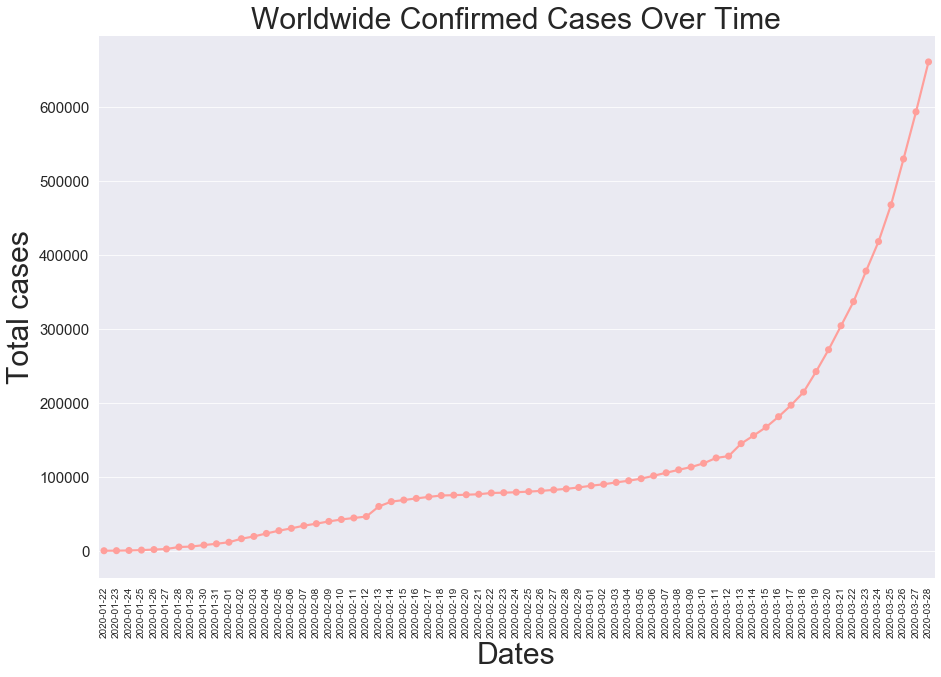

In [14]:
plt.figure(figsize= (15,10))
plt.xticks(rotation = 90 ,fontsize = 10)
plt.yticks(fontsize = 15)
plt.xlabel("Dates",fontsize = 30)
plt.ylabel('Total cases',fontsize = 30)
plt.title("Worldwide Confirmed Cases Over Time" , fontsize = 30)
total_cases = df.groupby('date')['date', 'confirmed'].sum().reset_index()
total_cases['date'] = pd.to_datetime(total_cases['date'])


ax = sns.pointplot( x = total_cases.date.dt.date ,y = total_cases.confirmed , color = 'r')
ax.set(xlabel='Dates', ylabel='Total cases')

#### Here are my observations :
##### 1) The slope of the line, in the beginning, was gradually ascending and at recent times, it's very high!
##### 2) At the current rate, there are no signs of a drop in the total cases.
##### 3) If protective measures are not taken, there's no wonder the slope reaches to max

## Top 20 countries having most confirmed cases

In [15]:
# group by country to sum and sort to get the top country list
top = df[df['date'] == df['date'].max()]
top_casualities = top.groupby(by = 'country')['confirmed'].sum().sort_values(ascending = False).head(20).reset_index()
top_casualities

,country,confirmed
0,US,121478
1,Italy,92472
2,China,81999
3,Spain,73235
4,Germany,57695
5,France,38105
6,Iran,35408
7,United Kingdom,17312
8,Switzerland,14076
9,Netherlands,9819


[Text(0, 0.5, 'Country'), Text(0.5, 0, 'Total cases')]

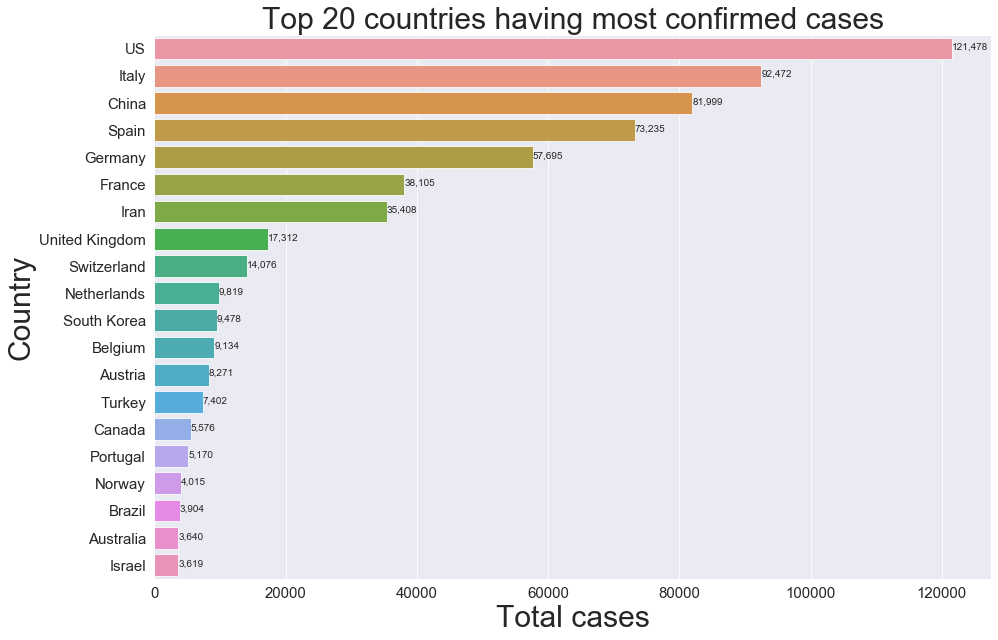

In [16]:
# viualize it
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Total cases",fontsize = 30)
plt.ylabel('Country',fontsize = 30)
plt.title("Top 20 countries having most confirmed cases" , fontsize = 30)
ax = sns.barplot(x = top_casualities.confirmed, y = top_casualities.country)
for i, (value, name) in enumerate(zip(top_casualities.confirmed,top_casualities.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=10, ha='left',  va='center')
ax.set(xlabel='Total cases', ylabel='Country')

#### Here are my observations :
##### 1) China was leading this from many days, but now they can control the pandemic spread.
##### 2) The number of confirmed cases are on a high in the US, Italy, Spain, and France.
##### 3) But the number of cases in the third world countries is quite less.

## C. Top 20 countries having most active cases

In [17]:
top_actives = top.groupby(by = 'country')['active'].sum().sort_values(ascending = False).head(20).reset_index()
top_actives

,country,active
0,US,118380
1,Italy,70065
2,Spain,54968
3,Germany,48781
4,France,30064
5,Iran,21212
6,United Kingdom,16140
7,Switzerland,12282
8,Netherlands,9173
9,Austria,7978


[Text(0, 0.5, 'Country'), Text(0.5, 0, 'Total cases')]

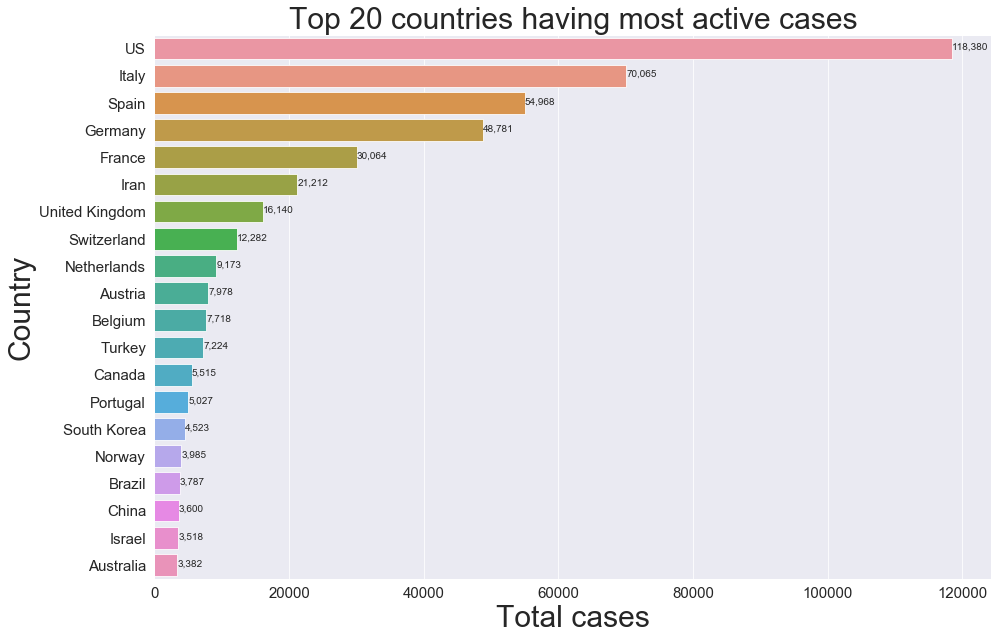

In [18]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Total cases",fontsize = 30)
plt.ylabel('Country',fontsize = 30)
plt.title("Top 20 countries having most active cases" , fontsize = 30)
ax = sns.barplot(x = top_actives.active, y = top_actives.country)
for i, (value, name) in enumerate(zip(top_actives.active, top_actives.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=10, ha='left',  va='center')
ax.set(xlabel='Total cases', ylabel='Country')

#### Here are my observations :
##### 1) As the covid-19 testing is increasing, The active number of cases is also increasing day by day.
##### 2) The number of active cases is on a high in the US, Italy, Spain, and France.
##### 3) In comparison with the total population, Italy, Spain and France are the worst-hit nation. 

## D. Top 20 countries having most deaths

In [19]:
top_deaths = top.groupby(by = 'country')['deaths'].sum().sort_values(ascending = False).head(20).reset_index()
top_deaths

,country,deaths
0,Italy,10023
1,Spain,5982
2,China,3299
3,Iran,2517
4,France,2317
5,US,2026
6,United Kingdom,1021
7,Netherlands,640
8,Germany,433
9,Belgium,353


[Text(0, 0.5, 'Country'), Text(0.5, 0, 'Total cases')]

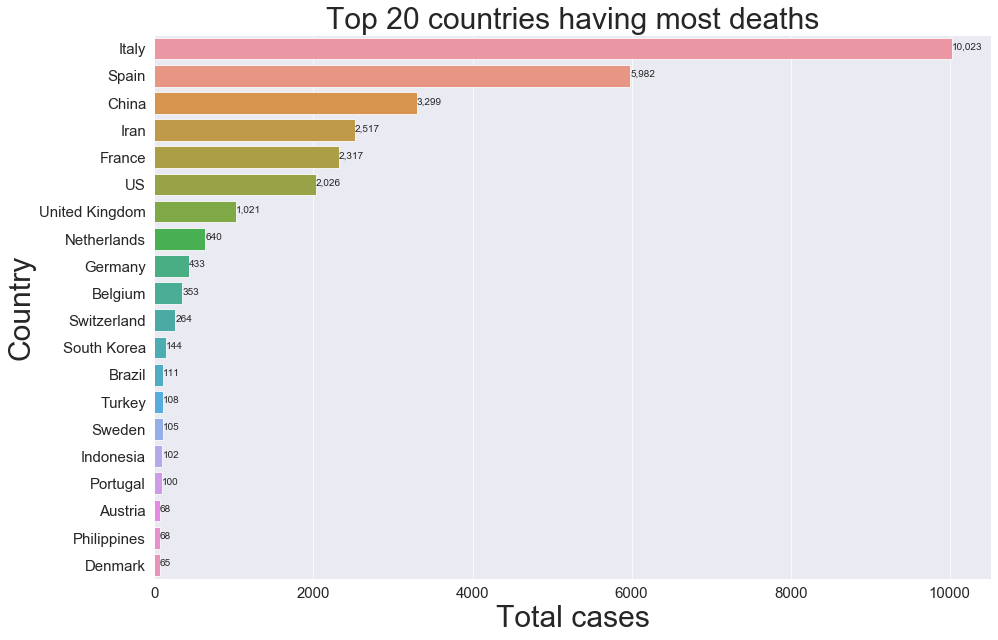

In [20]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Total cases",fontsize = 30)
plt.ylabel('Country',fontsize = 30)
plt.title("Top 20 countries having most deaths" , fontsize = 30)
ax = sns.barplot(x = top_deaths.deaths, y = top_deaths.country)
for i, (value, name) in enumerate(zip(top_deaths.deaths,top_deaths.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=10, ha='left',  va='center')
ax.set(xlabel='Total cases', ylabel='Country')

#### Here are my observations :
##### 1) Even though Italy has the 2nd best healthcare system according to the WHO, they haven't been able to tackle the pandemic problem effectively.
##### 2) China even having so many confirmed cases was able to decrease the number of deaths
##### 3) The number of deaths is also on a rise, especially in Italy, Spain, and Iran.

## E. Top 20 countries having most recovered cases

In [21]:
top_recovered = top.groupby(by = 'country')['recovered'].sum().sort_values(ascending = False).head(20).reset_index()
top_recovered

,country,recovered
0,China,75100
1,Italy,12384
2,Spain,12285
3,Iran,11679
4,Germany,8481
5,France,5724
6,South Korea,4811
7,Switzerland,1530
8,US,1072
9,Belgium,1063


[Text(0, 0.5, 'Country'), Text(0.5, 0, 'Total cases')]

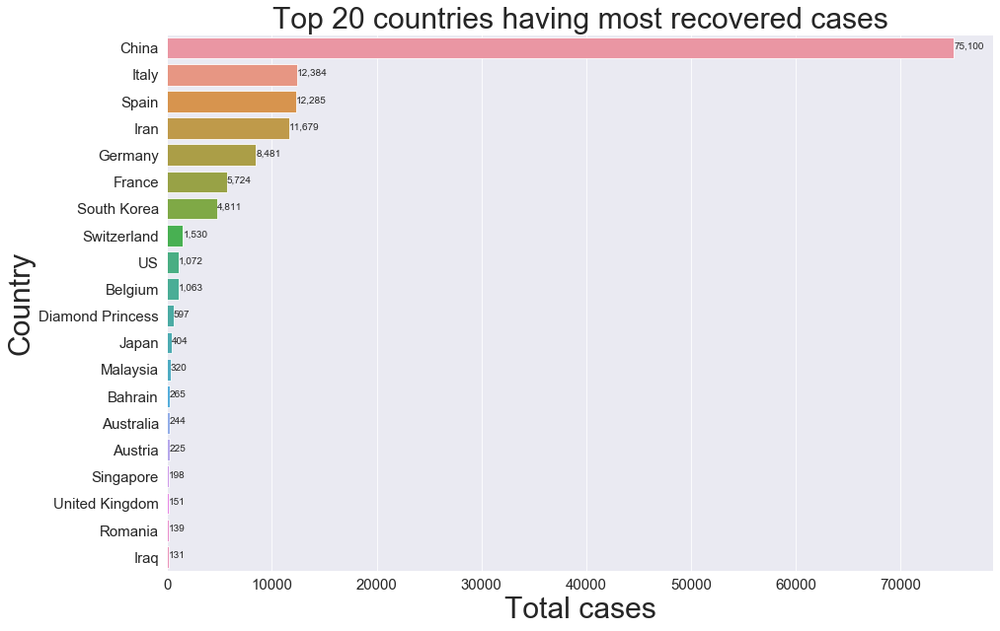

In [22]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Total cases",fontsize = 30)
plt.ylabel('Country',fontsize = 30)
plt.title("Top 20 countries having most recovered cases" , fontsize = 30)
ax = sns.barplot(x = top_recovered.recovered, y = top_recovered.country)
for i, (value, name) in enumerate(zip(top_recovered.recovered,top_recovered.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=10, ha='left',  va='center')
ax.set(xlabel='Total cases', ylabel='Country')

#### Here are my observations :
##### 1) By far China is leading in the number of recoveries even though having a huge number of confirmed cases
##### 2) Italy, Iran, and Spain are also doing a good job.
##### 3) We have to pump up these numbers for a promising future!

## F. Top 20 countries having the worst mortality and best recovery rate:

In [23]:
rate = top.groupby(by = 'country')['recovered','confirmed','deaths'].sum().reset_index()
rate['recovery percentage'] =  round(((rate['recovered']) / (rate['confirmed'])) * 100 , 2)
rate['death percentage'] =  round(((rate['deaths']) / (rate['confirmed'])) * 100 , 2)
rate

,country,recovered,confirmed,deaths,recovery percentage,death percentage
0,Afghanistan,2,110,4,1.82,3.64
1,Albania,31,197,10,15.74,5.08
2,Algeria,31,454,29,6.83,6.39
3,Andorra,1,308,3,0.32,0.97
4,Angola,0,5,0,0.00,0.00
5,Antigua and Barbuda,0,7,0,0.00,0.00
6,Argentina,72,690,18,10.43,2.61
7,Armenia,30,407,1,7.37,0.25
8,Australia,244,3640,14,6.70,0.38
9,Austria,225,8271,68,2.72,0.82


In [24]:
mortality = rate.groupby(by = 'country')['death percentage'].sum().sort_values(ascending = False).head(23).reset_index()
mortality

,country,death percentage
0,Gambia,33.33
1,Nicaragua,25.00
2,Cabo Verde,20.00
3,Sudan,20.00
4,Gabon,14.29
5,Zimbabwe,14.29
6,Guyana,12.50
7,Italy,10.84
8,Bangladesh,10.42
9,Niger,10.00


[Text(0, 0.5, 'Country'), Text(0.5, 0, 'Mortality Rate in percentage')]

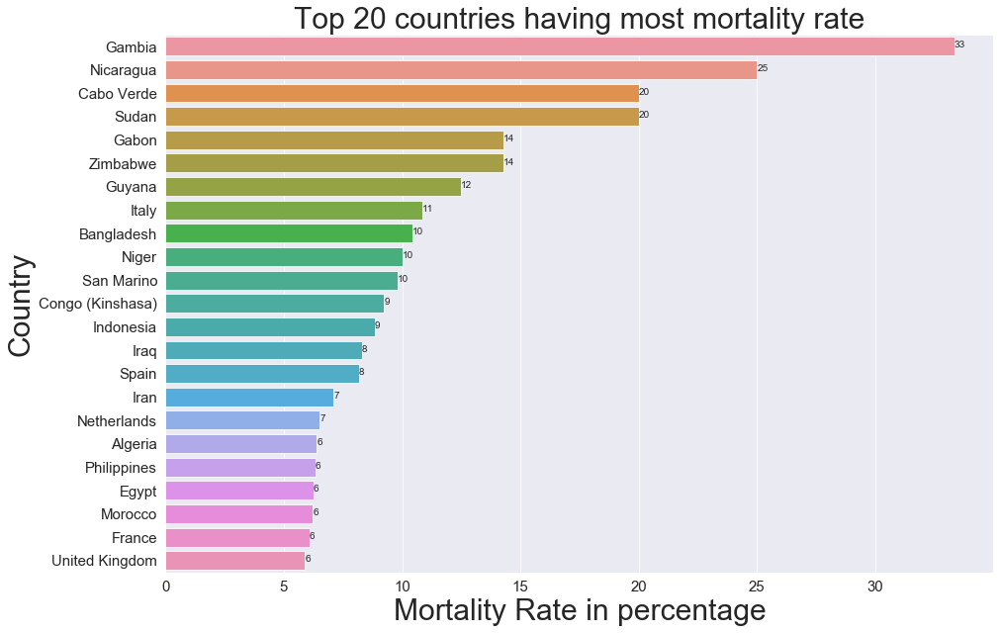

In [25]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Total cases",fontsize = 30)
plt.ylabel('Country',fontsize = 30)
plt.title("Top 20 countries having most mortality rate" , fontsize = 30)
ax = sns.barplot(x = mortality['death percentage'], y = mortality.country)
for i, (value, name) in enumerate(zip(mortality['death percentage'], mortality.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=10, ha='left',  va='center')
ax.set(xlabel='Mortality Rate in percentage', ylabel='Country')

##### Here are my observations:
##### 1) Zimbabwe, Sudan and the Gambia have the highest mortality rate because there is very less number of the confirmed cases, yet there more deaths in them.
##### 2) The majority of the countries which top the list have a bad healthcare system and they require help from developed countries.
##### 3) But when a minimum of 100 confirmed cases is considered, San Marino, Iraq and Indonesia top the charts
##### 4) When more than 10000 confirmed cases are considered, Italy is at the top and this percentage rate is very scary. It seems that they have lost control over the spread of covid-19 and cannot contain it.

In [26]:
recovery = rate.groupby(by = 'country')['recovery percentage'].sum().sort_values(ascending = False).head(20).reset_index()
recovery

,country,recovery percentage
0,Saint Vincent and the Grenadines,100.00
1,China,91.59
2,Diamond Princess,83.85
3,Maldives,56.25
4,Bahrain,55.67
5,South Korea,50.76
6,Belarus,34.04
7,Saint Lucia,33.33
8,Iran,32.98
9,Venezuela,32.77


[Text(0, 0.5, 'Country'), Text(0.5, 0, 'Recovery Rate in percentage')]

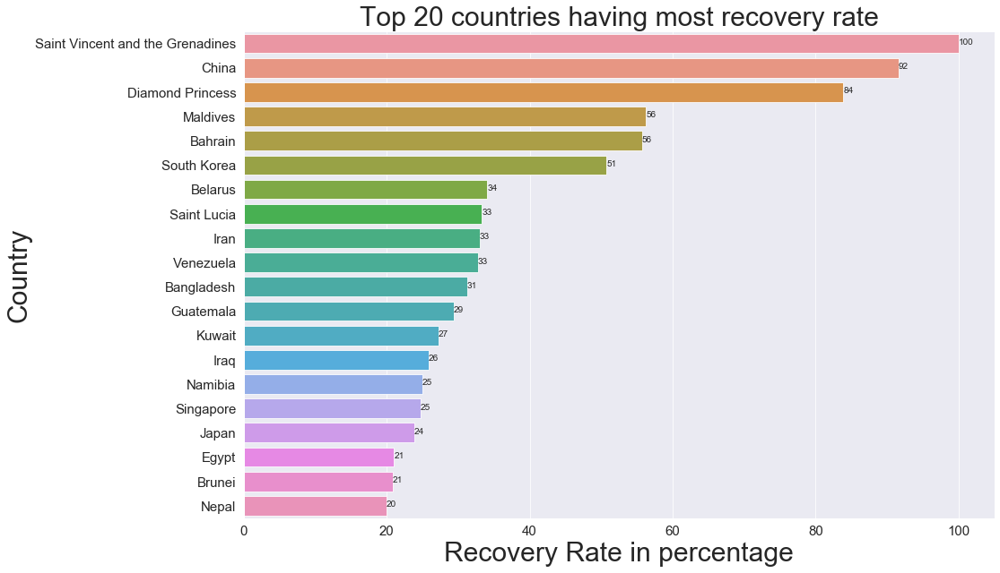

In [27]:
plt.figure(figsize= (15,10))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Total cases",fontsize = 30)
plt.ylabel('Country',fontsize = 30)
plt.title("Top 20 countries having most recovery rate" , fontsize = 30)
ax = sns.barplot(x = recovery['recovery percentage'], y = recovery.country)
for i, (value, name) in enumerate(zip(recovery['recovery percentage'], recovery.country)):
    ax.text(value, i-.05, f'{value:,.0f}',  size=10, ha='left',  va='center')
ax.set(xlabel='Recovery Rate in percentage', ylabel='Country')

##### Here are my observations:
##### 1) China tops the chart and they are doing a remarkable job with a recovery rate of 90%. It tells us that in every 100 infected people, 90 people have recovered from the covid-19 virus.
##### 2) The Cruise ship is unusual here as the outbreak was a while ago and it explains the high recovery rate.
##### 3) South Korea, Bahrain and Iran are also doing a fantastic job treating the covid-19 virus.
##### 4) Surprisingly the Maldives have recovered 8 out of their 13 confirmed cases.

# 3. Analysis of most affected countries

##### I will select the most affected countries for further analysis and visualization i.e China, US, Italy.
##### I will also select India so that I can analyze and foresee the covid - 19 problem of our country.
##### The analysis and visualizations of the covid cases in each country will start from the day of their first covid-19 case. From this, we can get valuable insights like the rate of growth of the covid-19 virus.

##### The first case of China recorded in this dataset is 22nd January,2020 . So let's consider it as day 1 and make the required changes in the dataset.

In [28]:
china =  df[df.country == 'China']
china = china.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
china

,date,recovered,deaths,confirmed,active
0,2020-01-22,28,17,548,503
1,2020-01-23,30,18,643,595
2,2020-01-24,36,26,920,858
3,2020-01-25,39,42,1406,1325
4,2020-01-26,49,56,2075,1970
5,2020-01-27,58,82,2877,2737
6,2020-01-28,101,131,5509,5277
7,2020-01-29,120,133,6087,5834
8,2020-01-30,135,171,8141,7835
9,2020-01-31,214,213,9802,9375


##### The first case recorded in US is on 24th February,2020. So let's consider it as day 1 and make the required changes in the dataset

In [29]:
us =  df[df.country == 'US']
us = us.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
us = us.iloc[33:].reset_index().drop('index', axis = 1)
us

,date,recovered,deaths,confirmed,active
0,2020-02-24,5,0,51,46
1,2020-02-25,6,0,51,45
2,2020-02-26,6,0,57,51
3,2020-02-27,6,0,58,52
4,2020-02-28,7,0,60,53
5,2020-02-29,7,1,68,60
6,2020-03-01,7,1,74,66
7,2020-03-02,7,6,98,85
8,2020-03-03,7,7,118,104
9,2020-03-04,7,11,149,131


##### The first case recorded in Italy is on 31st January. So let's consider it as day 1 and make the required changes in the dataset.

In [30]:
italy =  df[df.country == 'Italy']
italy = italy.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
italy = italy.iloc[9:].reset_index().drop('index', axis = 1)
italy

,date,recovered,deaths,confirmed,active
0,2020-01-31,0,0,2,2
1,2020-02-01,0,0,2,2
2,2020-02-02,0,0,2,2
3,2020-02-03,0,0,2,2
4,2020-02-04,0,0,2,2
5,2020-02-05,0,0,2,2
6,2020-02-06,0,0,2,2
7,2020-02-07,0,0,3,3
8,2020-02-08,0,0,3,3
9,2020-02-09,0,0,3,3


##### The first case recorded in India is on 30th January. So let's consider it as day 1 and make the required changes in the dataset.

In [31]:
india =  df[df.country == 'India']
india = india.groupby(by = 'date')['recovered', 'deaths', 'confirmed', 'active'].sum().reset_index()
india = india.iloc[8:].reset_index().drop('index', axis = 1)
india

,date,recovered,deaths,confirmed,active
0,2020-01-30,0,0,1,1
1,2020-01-31,0,0,1,1
2,2020-02-01,0,0,1,1
3,2020-02-02,0,0,2,2
4,2020-02-03,0,0,3,3
5,2020-02-04,0,0,3,3
6,2020-02-05,0,0,3,3
7,2020-02-06,0,0,3,3
8,2020-02-07,0,0,3,3
9,2020-02-08,0,0,3,3


## Comparision on no. of confirmed cases till date:

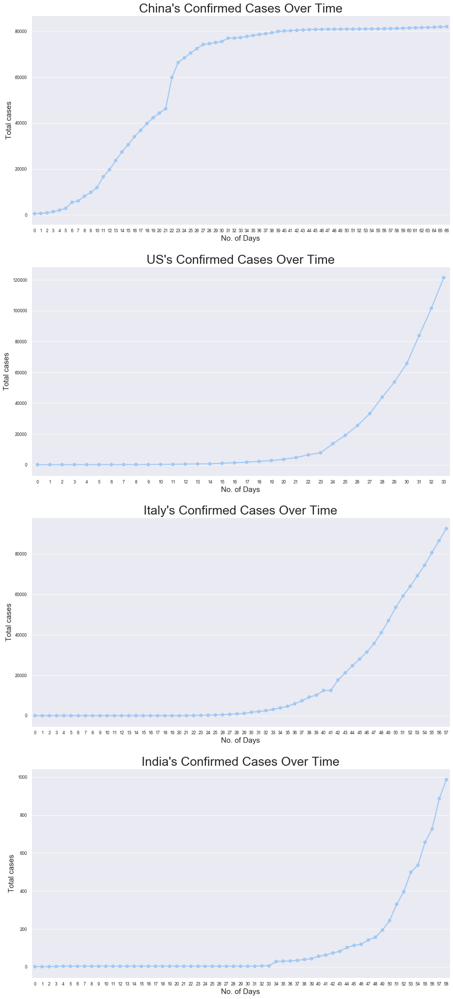

In [32]:
plt.figure(figsize=(15,30))
a = plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.confirmed)
plt.title("China's Confirmed Cases Over Time" , fontsize = 25)
plt.ylabel('Total cases', fontsize = 15)
plt.xlabel('No. of Days', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.confirmed)
plt.title("US's Confirmed Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.confirmed)
plt.title("Italy's Confirmed Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.confirmed)
plt.title("India's Confirmed Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

##### Here are my observations:
##### 1) From Day 0 to Day 15, China has very a high slope as the covid-19 originated there. Whereas in other countries, the slope is quite low.
##### 2) After day 15, there was an incremental rise in the number of cases in the US, whereas in Italy and India it is still less.
##### 3) But after that, there is a high surge in no. of cases in US and Italy
##### 4) India seems to be doing a great job in controlling the spread of the virus and keep the count of cases less. But lately, there has been a rise in the number of cases!

## Comparision on no. of active cases now:

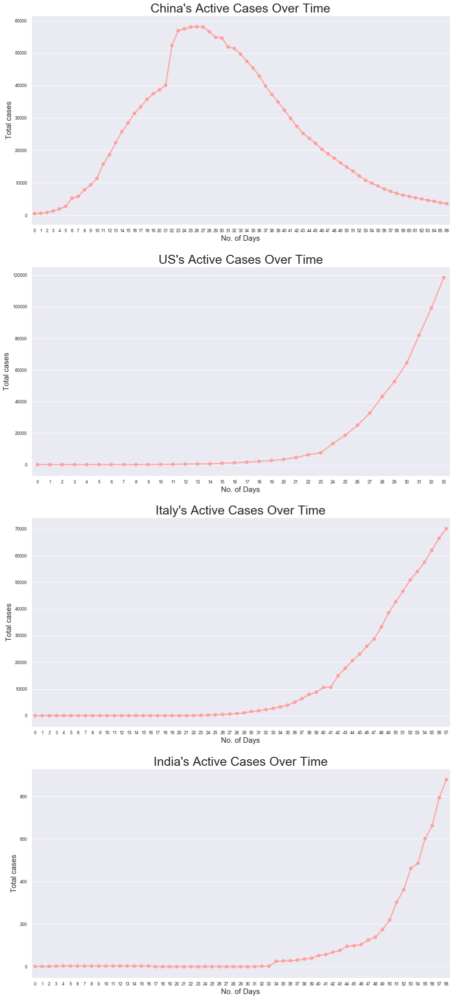

In [33]:
plt.figure(figsize=(15,30))
plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.active, color = 'r')
plt.title("China's Active Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.active, color = 'r')
plt.title("US's Active Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.active, color = 'r')
plt.title("Italy's Active Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.active, color = 'r')
plt.title("India's Active Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

##### Here are my observations:
##### 1) It's showing the same insights as to the confirmed cases
##### 2) But the only difference is the no.of active cases in China has been incrementally decreasing from day 30 as there a few deaths and a lot of recovered people and they have also prevented the spread of the covid-19 virus. 
##### 3) The no. of active cases in the US and Italy is rising detrimentally.
##### 4) Even though the slope of India is high but the rate of increase is less.

## Comparision on no. of death cases till date:

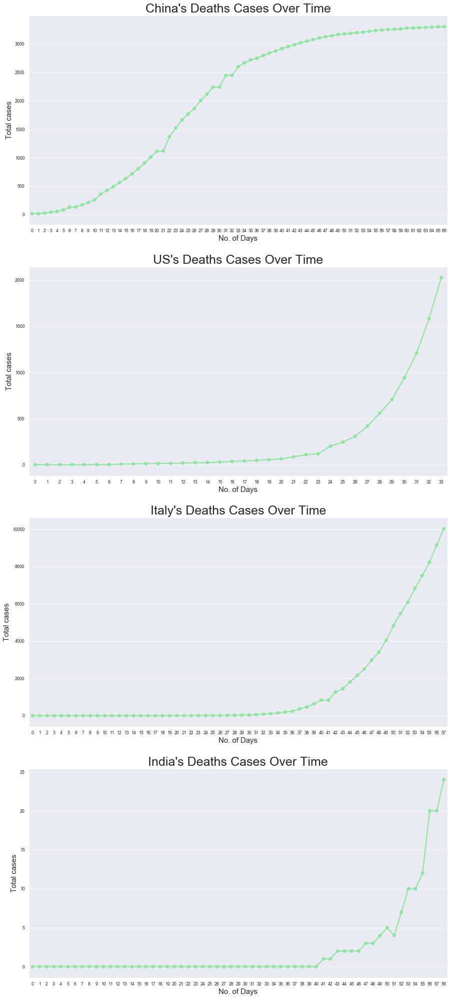

In [34]:
plt.figure(figsize=(15,30))
plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.deaths, color = 'g')
plt.title("China's Deaths Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.deaths, color = 'g')
plt.title("US's Deaths Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.deaths, color = 'g')
plt.title("Italy's Deaths Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.deaths, color = 'g')
plt.title("India's Deaths Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

##### Here are my observations:
##### 1) Even though China was the first to get the virus, they were able to minimize the no. of deaths considerably after Day 30.
##### 2) But lately there has been a huge surge in no. of deaths in Italy and it has also crossed the most no. of deaths in the world.
##### 3) There is also a slight increase in no. of deaths in the US.
##### 4) India on the other hand considerably have very less no. of deaths.

## Comparision on no. of recovered cases till date:

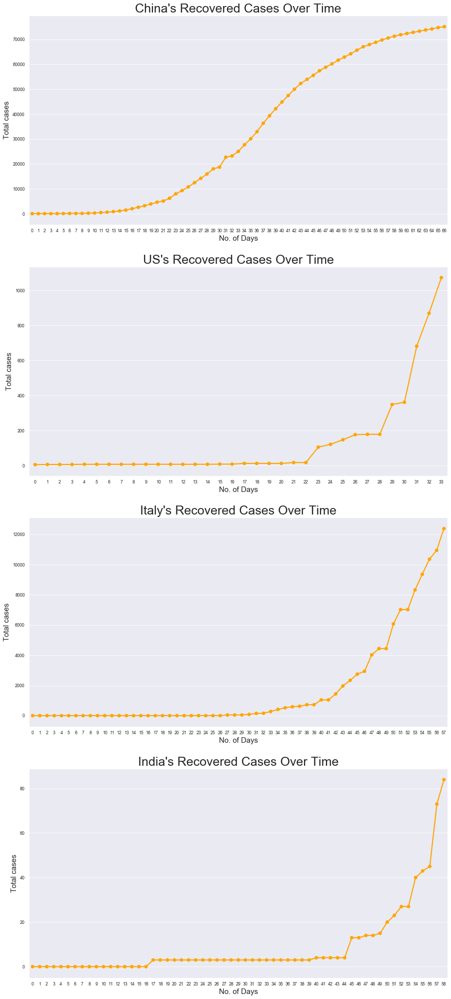

In [35]:
plt.figure(figsize=(15,30))
plt.subplot(4, 1, 1)
sns.pointplot(china.index ,china.recovered, color = 'orange')
plt.title("China's Recovered Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 2)
sns.pointplot(us.index ,us.recovered, color = 'orange')
plt.title("US's Recovered Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 3)
sns.pointplot(italy.index ,italy.recovered, color = 'orange')
plt.title("Italy's Recovered Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplot(4, 1, 4)
sns.pointplot(india.index ,india.recovered, color = 'orange')
plt.title("India's Recovered Cases Over Time" , fontsize = 25)
plt.xlabel('No. of Days', fontsize = 15)
plt.ylabel('Total cases', fontsize = 15)

plt.subplots_adjust(bottom=0.01, top=0.9)

##### Here are my observations:
##### 1) Compared to the number of confirmed cases, China has done an incredible job in recovering so many patients from the covid-19 pandemic.
##### 2) Italy is also trying to increase the number of recoveries, but lately the number of deaths has gone through the roof.
##### 3) Recoveries of the US and India are also less. 

## Using Deep Learning to Predict

In [36]:
# review data one more time
df.head()

,state,country,lat,long,date,confirmed,deaths,recovered,active
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0,0,0
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0


In [37]:
# drop some columns to keep data for deep learning only
df1 = df.drop(columns=['state', 'lat', 'long'])
df1.head()

,country,date,confirmed,deaths,recovered,active
0,Afghanistan,2020-01-22,0,0,0,0
1,Albania,2020-01-22,0,0,0,0
2,Algeria,2020-01-22,0,0,0,0
3,Andorra,2020-01-22,0,0,0,0
4,Angola,2020-01-22,0,0,0,0


In [38]:
df1

,country,date,confirmed,deaths,recovered,active
0,Afghanistan,2020-01-22,0,0,0,0
1,Albania,2020-01-22,0,0,0,0
2,Algeria,2020-01-22,0,0,0,0
3,Andorra,2020-01-22,0,0,0,0
4,Angola,2020-01-22,0,0,0,0
5,Antigua and Barbuda,2020-01-22,0,0,0,0
6,Argentina,2020-01-22,0,0,0,0
7,Armenia,2020-01-22,0,0,0,0
8,Australia,2020-01-22,0,0,0,0
9,Australia,2020-01-22,0,0,0,0


In [39]:
# US data
df_us = df1[df1['country']=='US']
df_us.head()

,country,date,confirmed,deaths,recovered,active
225,US,2020-01-22,1,0,0,1
477,US,2020-01-23,1,0,0,1
729,US,2020-01-24,2,0,0,2
981,US,2020-01-25,2,0,0,2
1233,US,2020-01-26,5,0,0,5


In [40]:
# prepare timeseries data
df_us = df_us.drop(columns=['country'])

# sort date
df_us = df_us.sort_values(['date'])

df_us

,date,confirmed,deaths,recovered,active
225,2020-01-22,1,0,0,1
477,2020-01-23,1,0,0,1
729,2020-01-24,2,0,0,2
981,2020-01-25,2,0,0,2
1233,2020-01-26,5,0,0,5
1485,2020-01-27,5,0,0,5
1737,2020-01-28,5,0,0,5
1989,2020-01-29,5,0,0,5
2241,2020-01-30,5,0,0,5
2493,2020-01-31,7,0,0,7


In [41]:
len(df_us)

67

In [42]:
# set date column as index
df_us = df_us.set_index('date')
df_us

,confirmed,deaths,recovered,active
date,,,,
2020-01-22,1,0,0,1
2020-01-23,1,0,0,1
2020-01-24,2,0,0,2
2020-01-25,2,0,0,2
2020-01-26,5,0,0,5
2020-01-27,5,0,0,5
2020-01-28,5,0,0,5
2020-01-29,5,0,0,5
2020-01-30,5,0,0,5


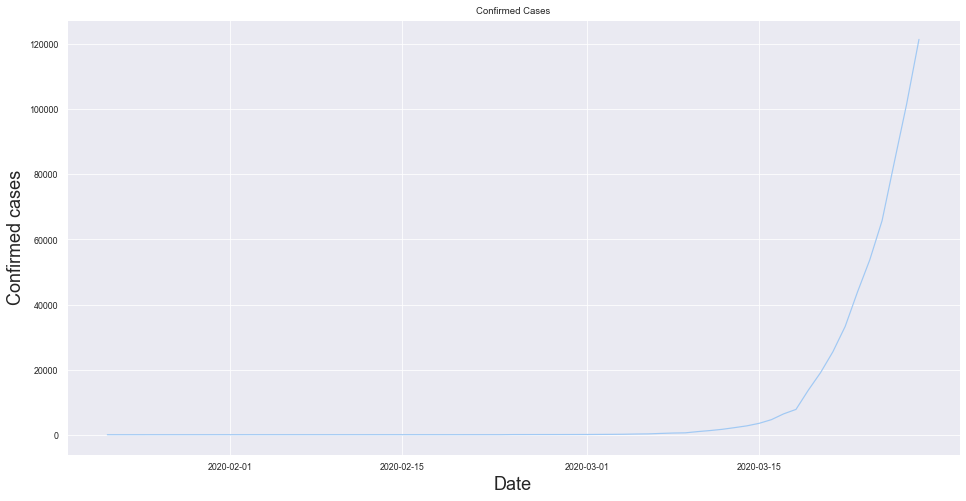

In [43]:
# visualize the confirmed cases
plt.figure(figsize=(16,8))
plt.title('Confirmed Cases')
plt.plot(df_us['confirmed'])
plt.xlabel('Date', fontsize=18)
plt.ylabel('Confirmed cases', fontsize=18)
plt.show()

In [44]:
# Create a new dataframe with only the confirmed column
data = df_us.filter(['confirmed'])

# Convert the dataframe to a numpy array
dataset = data.values

# Get the number of rows to train the model on
training_data_len = int(np.ceil( len(dataset) * .8 ))

training_data_len

54

In [45]:
# view dataset
dataset

array([[     1],
       [     1],
       [     2],
       [     2],
       [     5],
       [     5],
       [     5],
       [     5],
       [     5],
       [     7],
       [     8],
       [     8],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    11],
       [    12],
       [    12],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    13],
       [    15],
       [    15],
       [    15],
       [    51],
       [    51],
       [    57],
       [    58],
       [    60],
       [    68],
       [    74],
       [    98],
       [   118],
       [   149],
       [   217],
       [   262],
       [   402],
       [   518],
       [   583],
       [   959],
       [  1281],
       [  1663],
       [  2179],
       [  2727],
       [  3499],
       [  4632],
       [  6421],
       [  7783],
       [ 13677],
       [ 19100

In [46]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

array([[0.00000000e+00],
       [0.00000000e+00],
       [8.23201100e-06],
       [8.23201100e-06],
       [3.29280440e-05],
       [3.29280440e-05],
       [3.29280440e-05],
       [3.29280440e-05],
       [3.29280440e-05],
       [4.93920660e-05],
       [5.76240770e-05],
       [5.76240770e-05],
       [8.23201100e-05],
       [8.23201100e-05],
       [8.23201100e-05],
       [8.23201100e-05],
       [8.23201100e-05],
       [8.23201100e-05],
       [8.23201100e-05],
       [8.23201100e-05],
       [9.05521210e-05],
       [9.05521210e-05],
       [9.87841320e-05],
       [9.87841320e-05],
       [9.87841320e-05],
       [9.87841320e-05],
       [9.87841320e-05],
       [9.87841320e-05],
       [9.87841320e-05],
       [9.87841320e-05],
       [1.15248154e-04],
       [1.15248154e-04],
       [1.15248154e-04],
       [4.11600550e-04],
       [4.11600550e-04],
       [4.60992616e-04],
       [4.69224627e-04],
       [4.85688649e-04],
       [5.51544737e-04],
       [6.00936803e-04],


In [47]:
# Create the training data set
# Create the scaled training data set
train_data = scaled_data[0:int(training_data_len), :]

# Split the data into x_train and y_train data sets
x_train = []
y_train = []



In [48]:
range(60, len(train_data))

range(60, 54)

In [49]:
chunk_size=7
for i in range(chunk_size, len(train_data)):
    x_train.append(train_data[i-chunk_size:i, 0])
    y_train.append(train_data[i, 0])

In [50]:
print(x_train)
print(y_train)

[array([0.0000000e+00, 0.0000000e+00, 8.2320110e-06, 8.2320110e-06,
       3.2928044e-05, 3.2928044e-05, 3.2928044e-05]), array([0.0000000e+00, 8.2320110e-06, 8.2320110e-06, 3.2928044e-05,
       3.2928044e-05, 3.2928044e-05, 3.2928044e-05]), array([8.2320110e-06, 8.2320110e-06, 3.2928044e-05, 3.2928044e-05,
       3.2928044e-05, 3.2928044e-05, 3.2928044e-05]), array([8.2320110e-06, 3.2928044e-05, 3.2928044e-05, 3.2928044e-05,
       3.2928044e-05, 3.2928044e-05, 4.9392066e-05]), array([3.2928044e-05, 3.2928044e-05, 3.2928044e-05, 3.2928044e-05,
       3.2928044e-05, 4.9392066e-05, 5.7624077e-05]), array([3.2928044e-05, 3.2928044e-05, 3.2928044e-05, 3.2928044e-05,
       4.9392066e-05, 5.7624077e-05, 5.7624077e-05]), array([3.2928044e-05, 3.2928044e-05, 3.2928044e-05, 4.9392066e-05,
       5.7624077e-05, 5.7624077e-05, 8.2320110e-05]), array([3.2928044e-05, 3.2928044e-05, 4.9392066e-05, 5.7624077e-05,
       5.7624077e-05, 8.2320110e-05, 8.2320110e-05]), array([3.2928044e-05, 4.9392066

In [51]:
# Convert the x_train and y_train to numpy arrays 
x_train, y_train = np.array(x_train), np.array(y_train)

In [52]:
# Reshape the data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_train.shape

(47, 7, 1)

In [53]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(50, return_sequences= False))
model.add(Dense(25))
model.add(Dense(1))

Using TensorFlow backend.


In [54]:
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

In [55]:
# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=30)

Epoch 1/30
47/47 [==============================] - 1s 20ms/step - loss: 9.5600e-05
Epoch 2/30
47/47 [==============================] - 0s 7ms/step - loss: 6.1123e-05
Epoch 3/30
47/47 [==============================] - 0s 7ms/step - loss: 3.9926e-05
Epoch 4/30
47/47 [==============================] - 0s 7ms/step - loss: 4.2694e-05
Epoch 5/30
47/47 [==============================] - 0s 7ms/step - loss: 3.7680e-05
Epoch 6/30
47/47 [==============================] - 0s 7ms/step - loss: 5.0608e-05
Epoch 7/30
47/47 [==============================] - 0s 7ms/step - loss: 5.8511e-05
Epoch 8/30
47/47 [==============================] - 0s 7ms/step - loss: 6.0538e-05
Epoch 9/30
47/47 [==============================] - 0s 7ms/step - loss: 4.0774e-05
Epoch 10/30
47/47 [==============================] - 0s 7ms/step - loss: 4.2188e-05
Epoch 11/30
47/47 [==============================] - 0s 8ms/step - loss: 4.5820e-05
Epoch 12/30
47/47 [==============================] - 0s 7ms/step - loss: 5.7491e-05


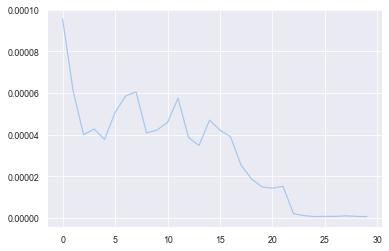

In [56]:
# examine the loss function v.s. epoch
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [57]:
# Create the testing data set
test_data = scaled_data[training_data_len - chunk_size:, :]

# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(chunk_size, len(test_data)):
    x_test.append(test_data[i-chunk_size:i, 0])

In [58]:
# Convert the data to a numpy array
x_test = np.array(x_test)

In [59]:
# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

In [60]:
# Get the models predict values 
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

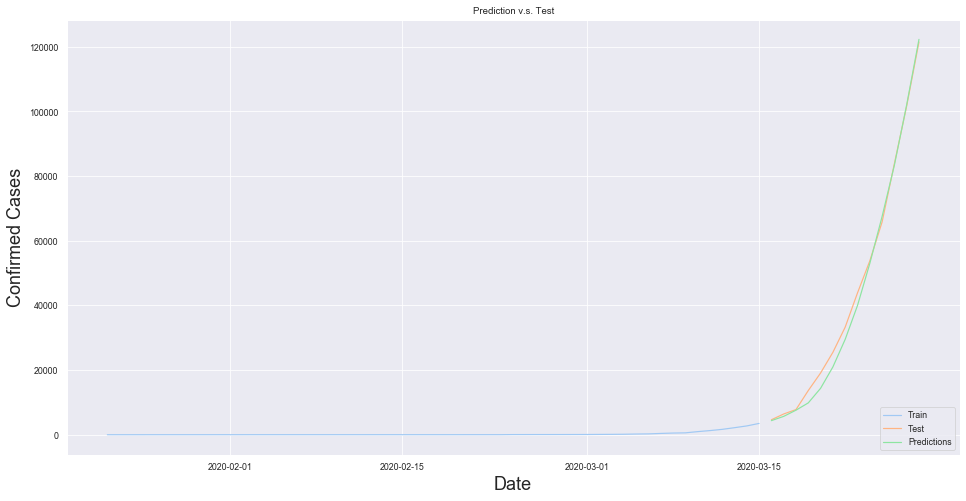

In [61]:
# Plot the data
train = data[:training_data_len]
test = data[training_data_len:]
test['predictions'] = predictions

# Visualize the data
plt.figure(figsize=(16,8))
plt.title('Prediction v.s. Test')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Confirmed Cases', fontsize=18)
plt.plot(train['confirmed'])
plt.plot(test[['confirmed', 'predictions']])
plt.legend(['Train', 'Test', 'Predictions'], loc='lower right')
plt.show()

In [62]:
# show the table of prediction v.s. test
test

,confirmed,predictions
date,,
2020-03-16,4632,4360.661621
2020-03-17,6421,5678.900391
2020-03-18,7783,7596.673340
2020-03-19,13677,9853.951172
2020-03-20,19100,14363.670898
2020-03-21,25489,20968.494141
2020-03-22,33276,29498.228516
2020-03-23,43847,39962.109375
2020-03-24,53740,52951.000000


# Predict into the future

### Try to predict for one day ahead based on the last 30 days

In [63]:
# Create the testing data set
predict_data = scaled_data[len(scaled_data) - chunk_size:, :]

# Create the data sets x_test and y_test
x_predict = []
x_predict.append(predict_data[:, 0])
    

In [64]:
# Convert the data to a numpy array
x_predict = np.array(x_predict)

In [65]:
# Reshape the data
x_predict = np.reshape(x_predict, (x_predict.shape[0], x_predict.shape[1], 1 ))

In [66]:
# Get the models predict values 
future_predictions = model.predict(x_predict)

future_predictions

array([[1.1774588]], dtype=float32)

In [67]:
# inverse value
future_predictions = scaler.inverse_transform(future_predictions)

In [68]:
print(future_predictions)

[[143035.16]]


### Now, try to predict for the next 2 days

In [69]:
future_days = 2

new_predictions = []

for i in range(future_days):
    # Get the models predicted price values 
    predictions = model.predict(x_predict)

    # take the predicted value only
    current_prediction = predictions[0]
    print(current_prediction)
    
    # store prediction
    new_predictions.append(current_prediction) 
    
    # update batch to now include prediction and drop first value
    x_predict = np.append(x_predict[:,1:,:],[[current_prediction]], axis=1)
    

[1.1774588]
[1.3449197]


In [70]:
# inverse values
new_predictions = scaler.inverse_transform(new_predictions)
new_predictions

array([[143035.15816784],
       [163377.80815554]])

In [71]:
# last date in dataset
data.index[-1]

Timestamp('2020-03-28 00:00:00')

In [75]:
# build future dates of next 7 days
future_dates = pd.date_range(data.index[-1], periods=3, freq='D')
future_dates = future_dates[1:]
future_dates

DatetimeIndex(['2020-03-29', '2020-03-30'], dtype='datetime64[ns]', freq='D')

In [76]:
# reshape new prediction to get values only
new_predictions = np.reshape(new_predictions, new_predictions.shape[0])

In [77]:
# build dataframe of future predicted data
future_df = pd.DataFrame({'date': future_dates, 'future predictions': new_predictions})

In [78]:
# set date as index
future_df = future_df.set_index(['date'])
future_df

,future predictions
date,
2020-03-29,143035.158168
2020-03-30,163377.808156


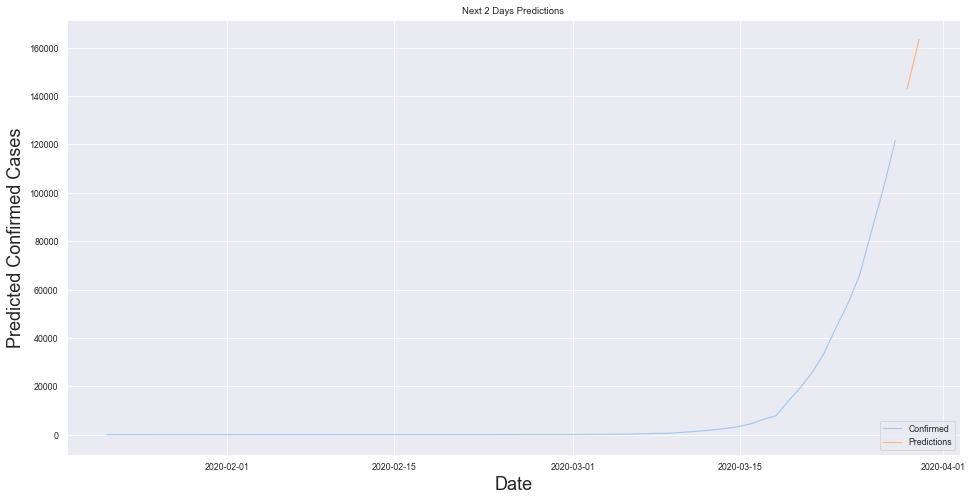

In [83]:
# Visualize the data
plt.figure(figsize=(16,8))
plt.title('Next 2 Days Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Predicted Confirmed Cases', fontsize=18)

plt.plot(data['confirmed'])
plt.plot(future_df['future predictions'])

plt.legend(['Confirmed','Predictions'], loc='lower right')
plt.show()